# Dengue Case Prediction using Machine Learning

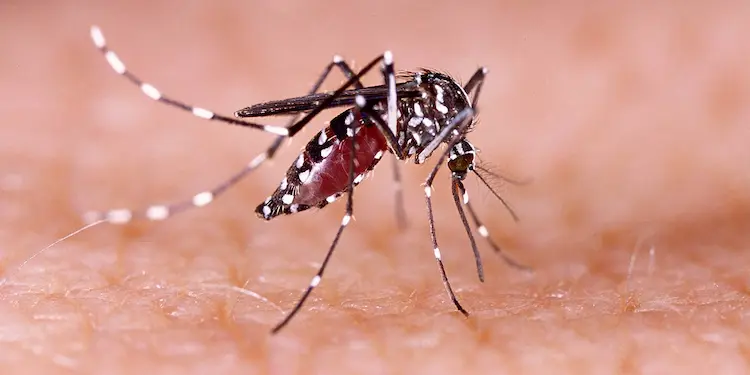# 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
 df = pd.read_csv('dengue.csv')

In [4]:
df.head()

,serial,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases,labels
0,0,34.053151,24.478082,28.709863,39.757808,25.317808,32.306301,22.971233,73.508219,2.921726,...,1007.911781,50.747945,3.789863,208.097808,17.973699,7.232877,2.558904,1.197260,4925.0,normal
1,1,34.086179,25.694309,29.464228,41.338211,28.140650,34.423577,23.484553,72.066667,3.783415,...,1003.533333,48.313821,2.884553,222.926016,19.246341,7.504065,1.658537,0.991870,5077.0,normal
2,2,34.573984,25.417886,29.526829,40.464228,26.560163,33.085366,22.580488,69.424390,3.065854,...,1005.731707,55.621138,4.242276,229.413008,19.802439,7.829268,1.910569,1.170732,7579.0,normal
3,3,33.020325,25.080488,28.727642,37.878049,26.193496,31.772358,21.752033,69.297561,6.025203,...,1003.359350,50.208130,2.991057,225.421951,19.480488,7.593496,1.300813,0.146341,13706.0,normal
4,4,30.660976,24.230894,26.774797,36.586992,24.263415,28.943902,24.214634,86.652033,23.336585,...,1009.995935,45.542276,3.886992,176.598374,15.261789,6.186992,0.967480,3.951220,82.0,normal


In [5]:
df = df.drop('serial', axis = 1)

In [6]:
df.duplicated().sum()

0

In [7]:
df.isnull().sum()

tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
conditions          0
stations            0
cases               0
labels              0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 602 entries, 0 to 601
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tempmax           602 non-null    float64
 1   tempmin           602 non-null    float64
 2   temp              602 non-null    float64
 3   feelslikemax      602 non-null    float64
 4   feelslikemin      602 non-null    float64
 5   feelslike         602 non-null    float64
 6   dew               602 non-null    float64
 7   humidity          602 non-null    float64
 8   precip            602 non-null    float64
 9   precipprob        602 non-null    float64
 10  precipcover       602 non-null    float64
 11  snow              602 non-null    float64
 12  snowdepth         602 non-null    float64
 13  windspeed         602 non-null    float64
 14  winddir           602 non-null    float64
 15  sealevelpressure  602 non-null    float64
 16  cloudcover        602 non-null    float64
 1

In [9]:
df.describe()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases
count,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,...,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000
mean,31.918079,24.588318,27.813181,38.476069,25.613154,31.485111,23.984349,81.254786,13.120862,69.625588,...,191.498693,1004.690531,59.701192,3.632620,199.802695,17.251785,6.877674,1.827725,0.859734,8502.342193
std,2.737215,2.727919,2.412416,4.776400,4.178797,4.672951,2.668014,9.406354,28.463365,45.539264,...,81.604668,41.364967,20.832639,1.890352,54.128192,4.676051,1.763928,1.237389,0.973575,6780.749627
min,25.000000,12.740000,18.820000,25.000000,12.360000,18.626667,4.480000,40.833333,0.000000,0.000000,...,0.500000,0.000000,0.000000,0.800000,57.900000,5.000000,2.000000,0.000000,0.000000,52.000000
25%,30.025000,23.200000,26.500000,35.600000,23.200000,28.100000,23.300000,75.800000,0.000000,0.000000,...,134.425000,1002.025000,47.400000,2.523780,160.350000,13.900000,6.000000,1.000000,0.000000,3017.750000
50%,31.700000,25.000000,27.900000,38.400000,25.000000,31.500000,24.529268,82.800000,3.000000,100.000000,...,207.300000,1007.000000,63.700000,3.200000,205.750000,17.750000,7.000000,2.000000,1.000000,7490.000000
75%,33.600000,26.500000,29.448171,41.900000,26.600000,34.875000,25.475000,88.175000,12.589000,100.000000,...,252.375000,1010.185772,73.200000,4.300000,238.800610,20.600610,8.000000,3.000000,1.000000,12702.500000
max,41.200000,29.400000,33.300000,49.600000,37.900000,42.900000,28.100000,99.300000,302.000000,100.000000,...,359.200000,1020.000000,97.900000,24.033333,318.500000,27.700000,10.000000,4.000000,5.000000,24983.000000


In [10]:
 df.nunique()

tempmax             118
tempmin             126
temp                125
feelslikemax        192
feelslikemin        157
feelslike           202
dew                 123
humidity            295
precip              207
precipprob           17
precipcover          35
snow                  1
snowdepth             1
windspeed           165
winddir             539
sealevelpressure    221
cloudcover          408
visibility           77
solarradiation      523
solarenergy         196
uvindex              24
conditions           20
stations             17
cases               578
labels                1
dtype: int64

In [11]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['labels'], dtype='object')

Numerical type columns:
Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'snow', 'snowdepth', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'conditions', 'stations', 'cases'],
      dtype='object')


In [18]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []
    
    for column in df.columns:
        if df[column].dtype == 'object':
            categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            non_categorical_features.append(column)
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
    
    return categorical_features, non_categorical_features, discrete_features, continuous_features

# Example usage
categorical, non_categorical, discrete, continuous = classify_features(df)

print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['labels']
Non-Categorical Features: ['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover', 'snow', 'snowdepth', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'conditions', 'stations', 'cases']
Discrete Features: ['snow', 'snowdepth']
Continuous Features: ['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'conditions', 'stations', 'cases']


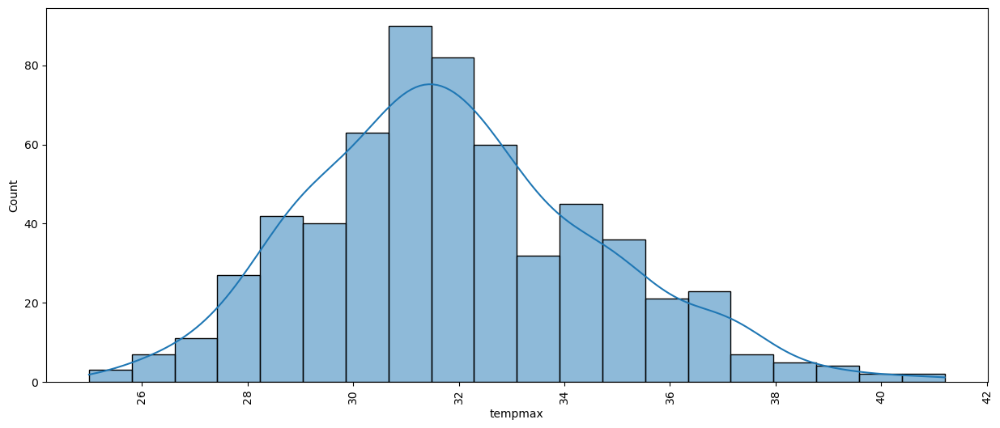

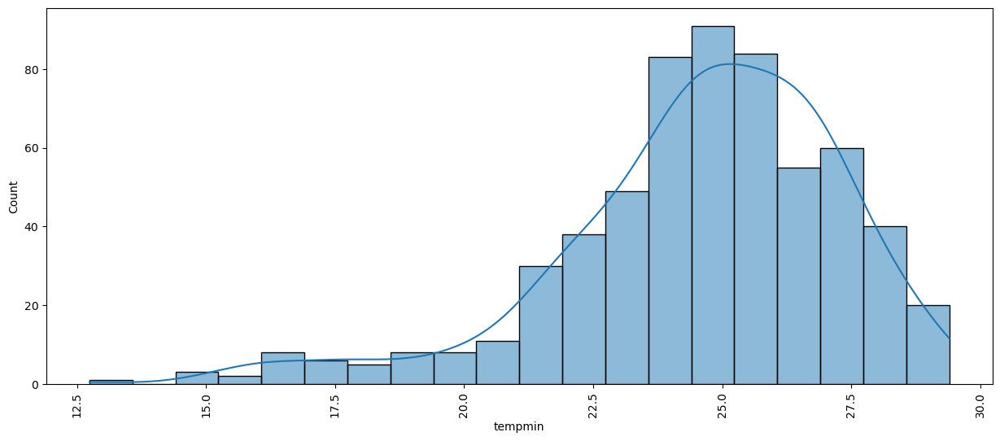

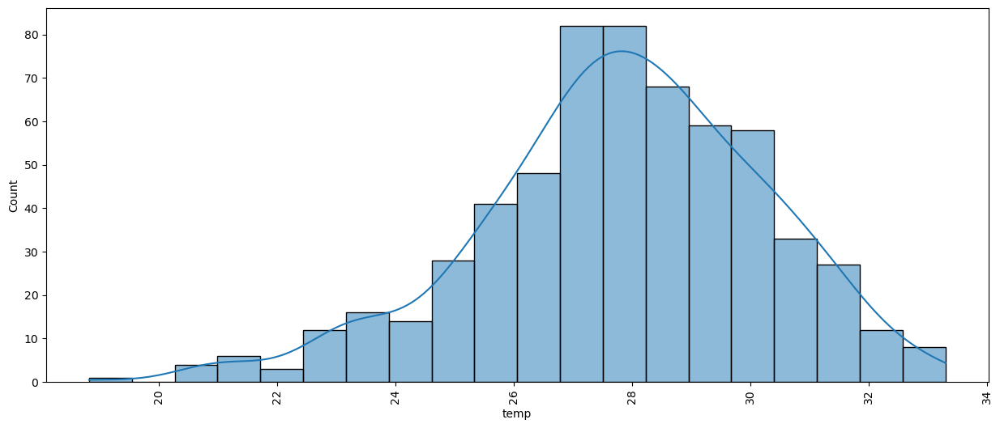

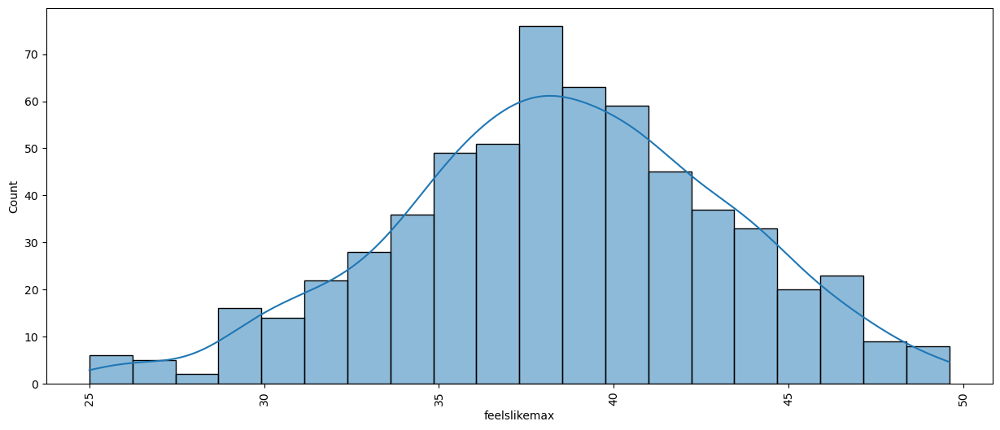

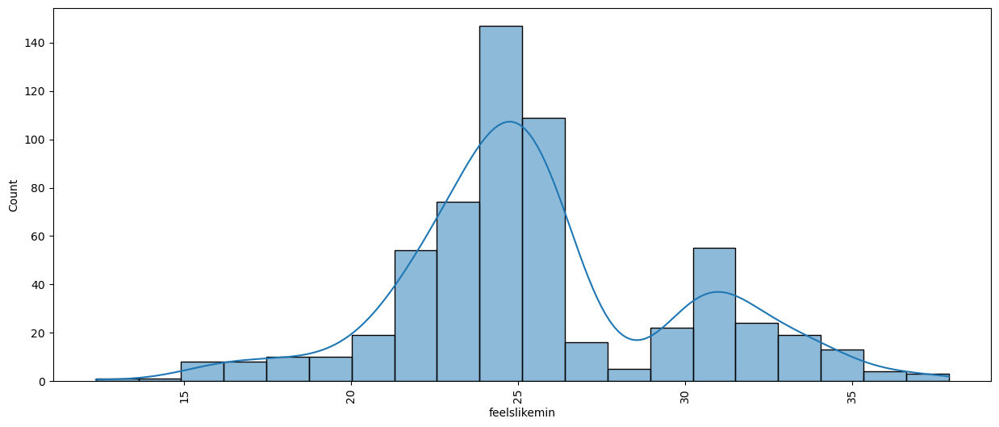

...

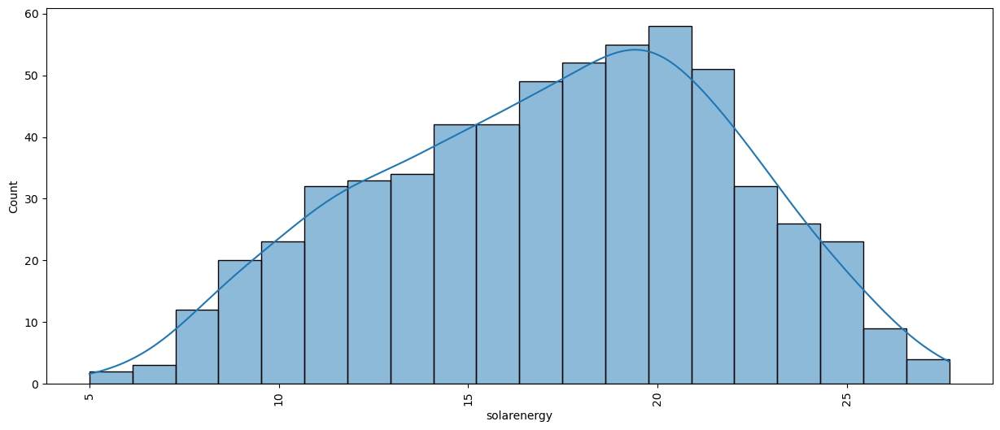

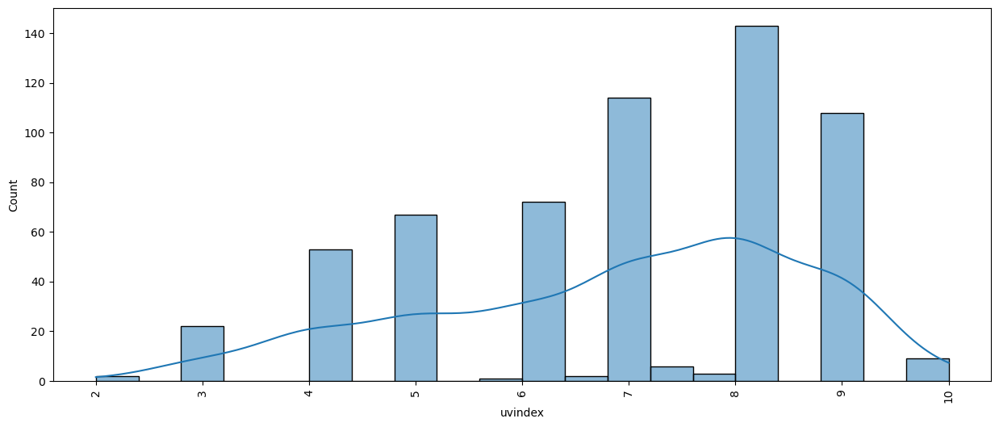

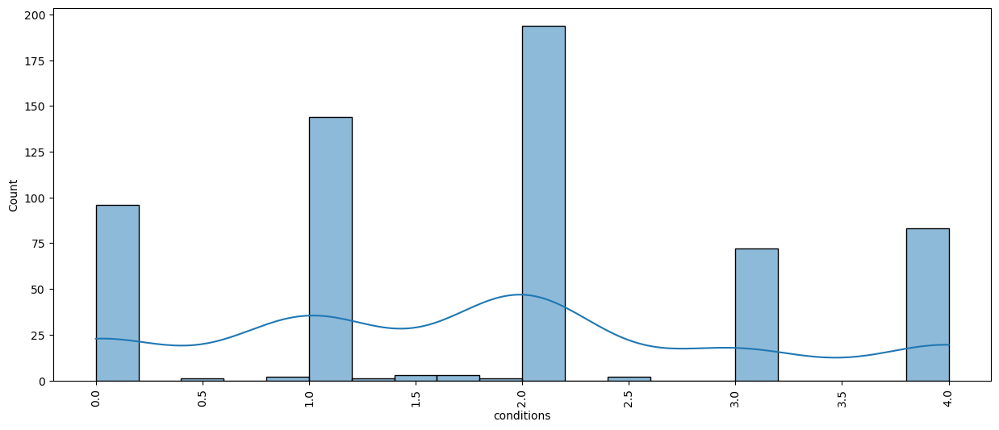

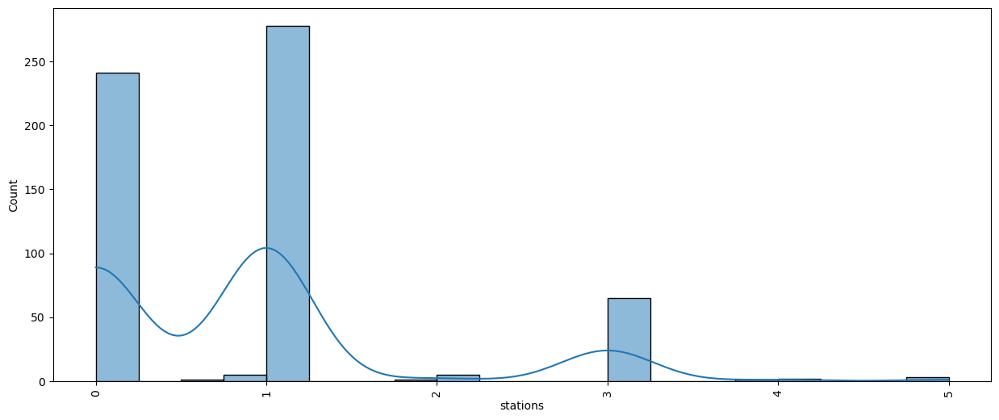

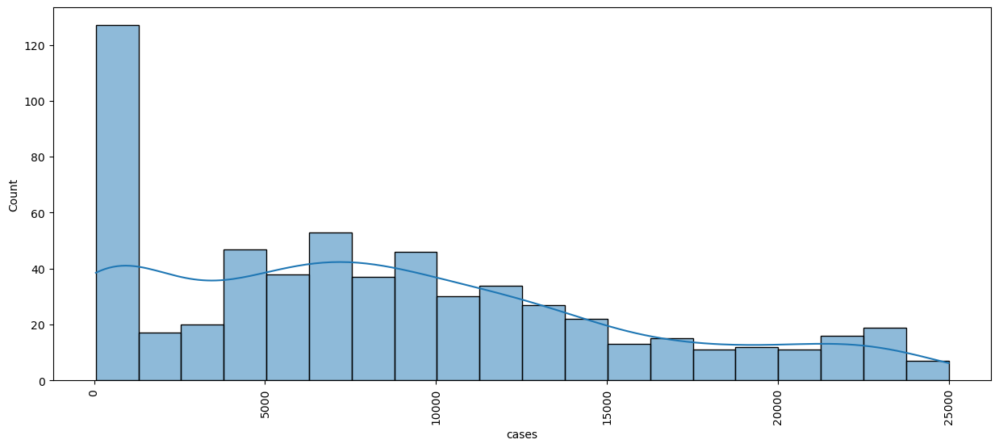

In [20]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

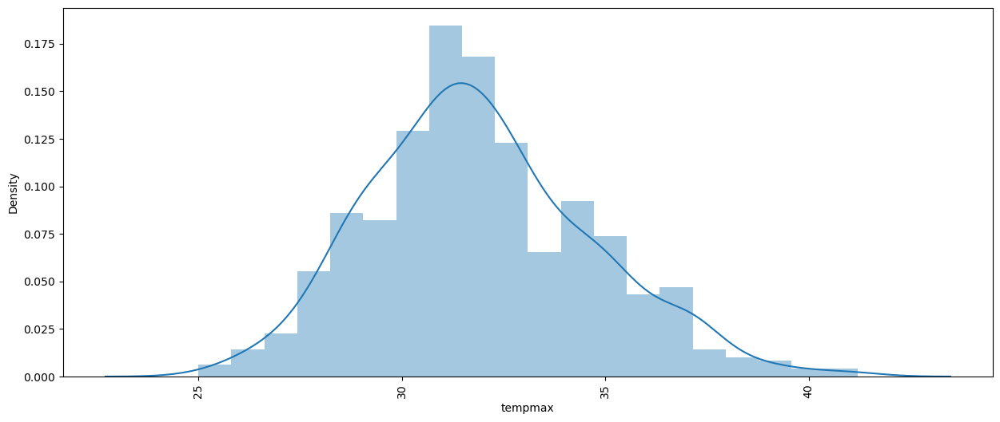

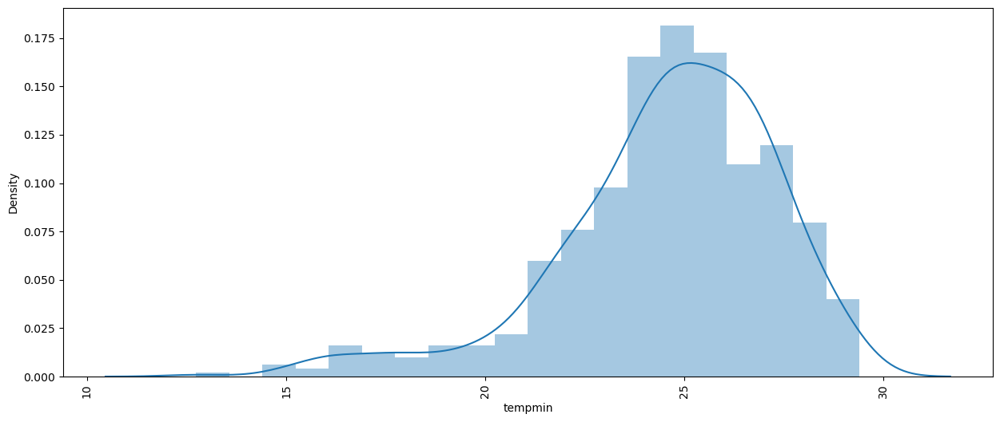

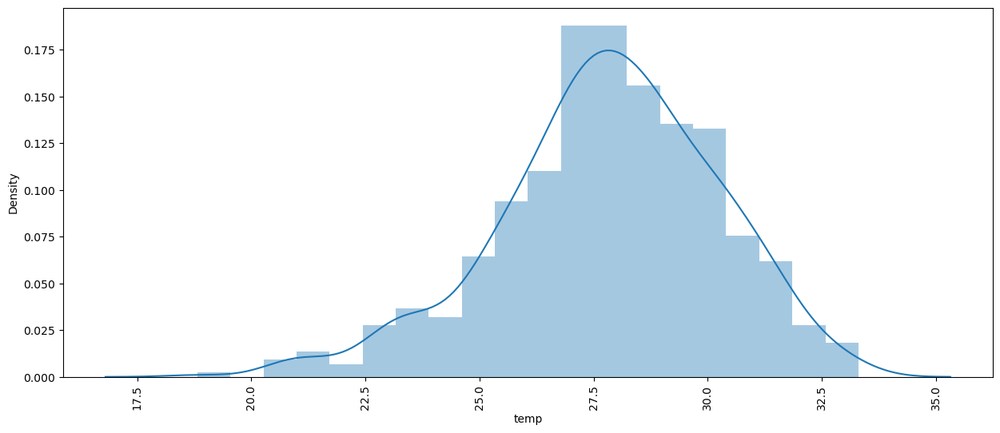

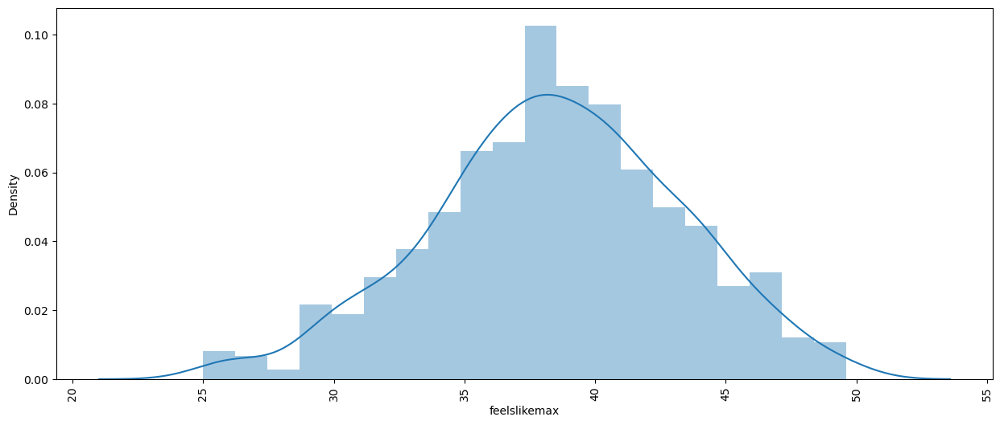

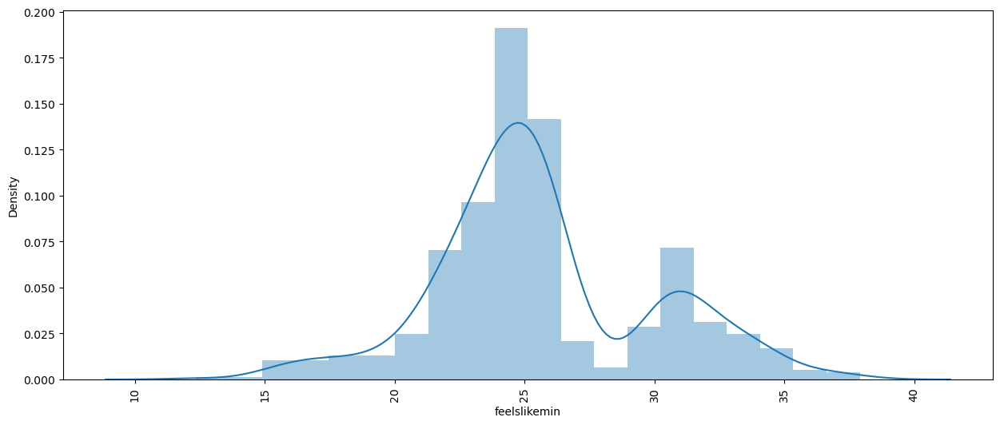

...

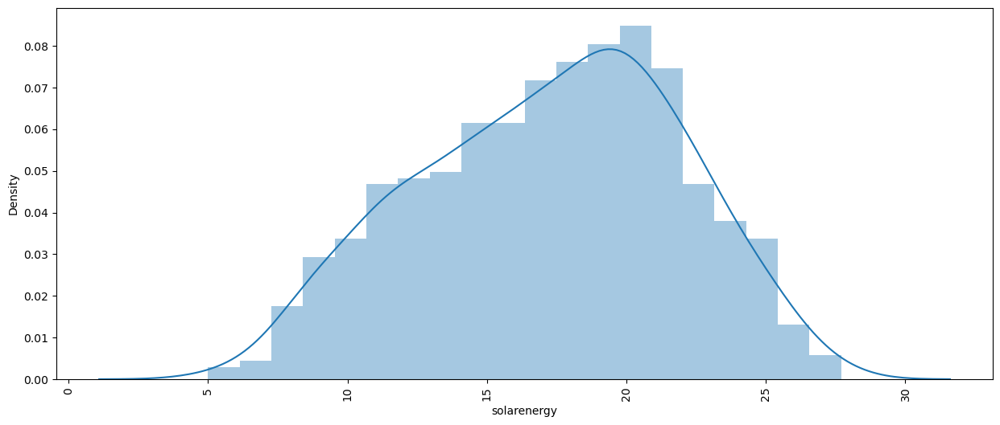

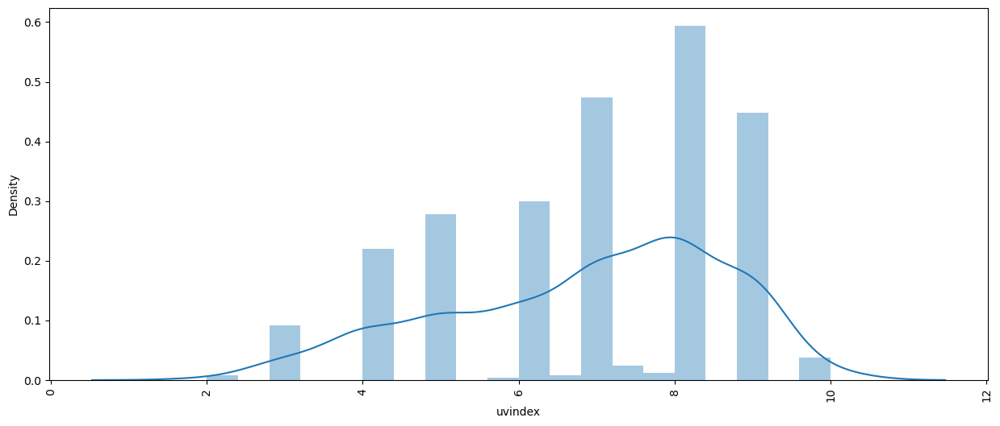

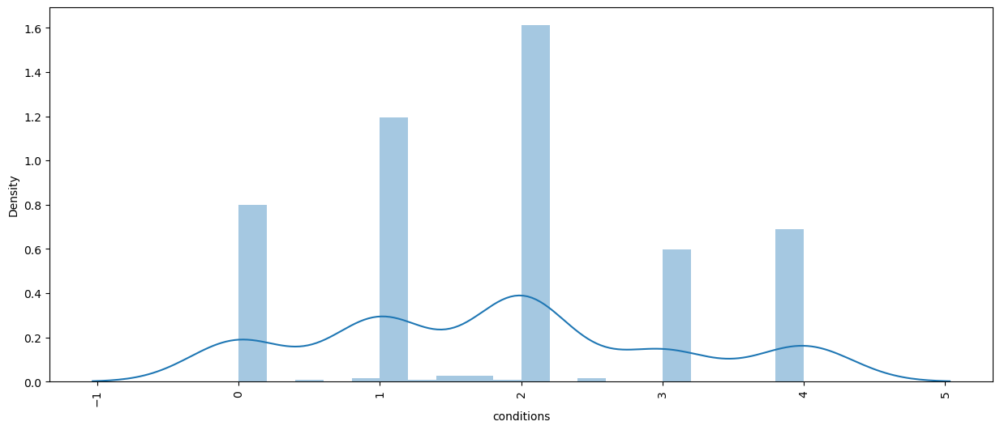

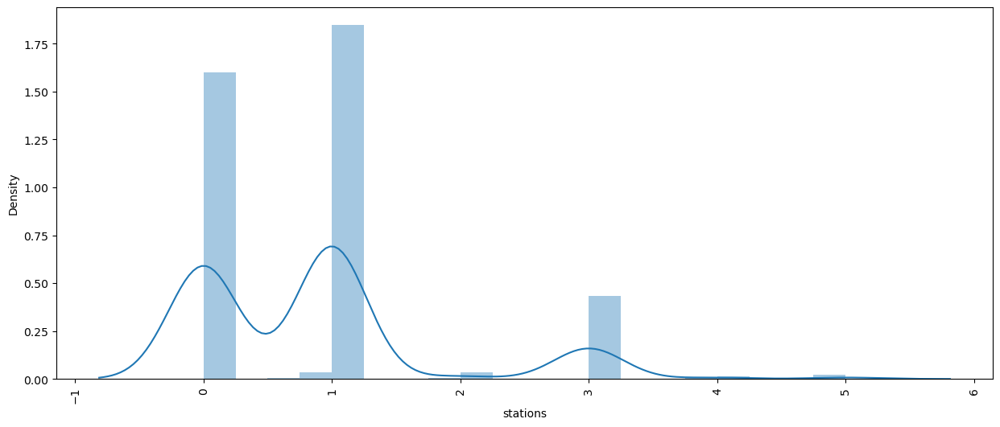

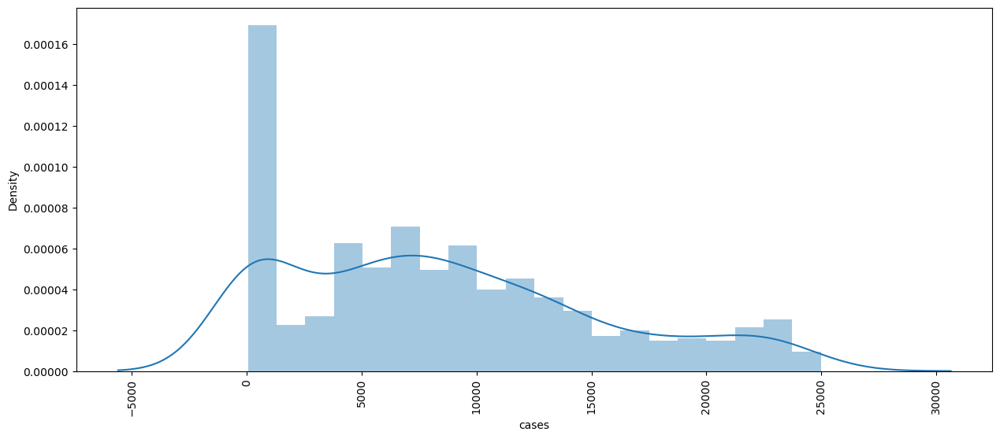

In [21]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde =True)
    plt.xticks(rotation =90)
    plt.show()


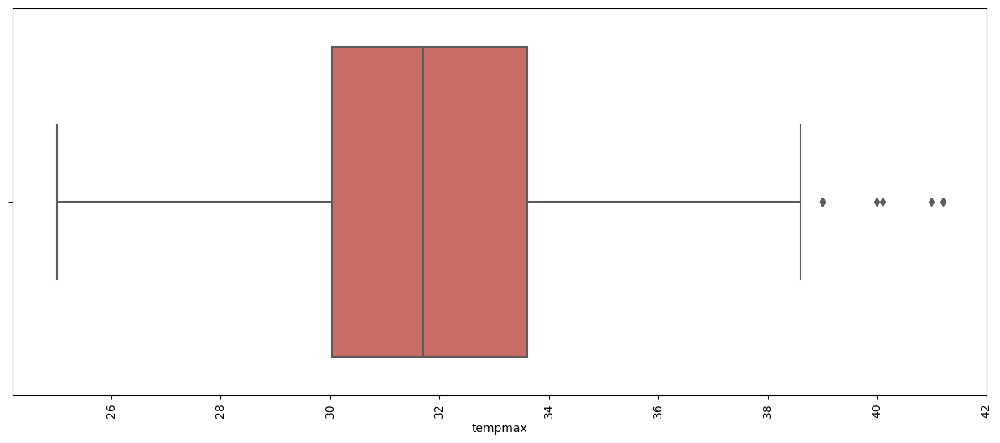

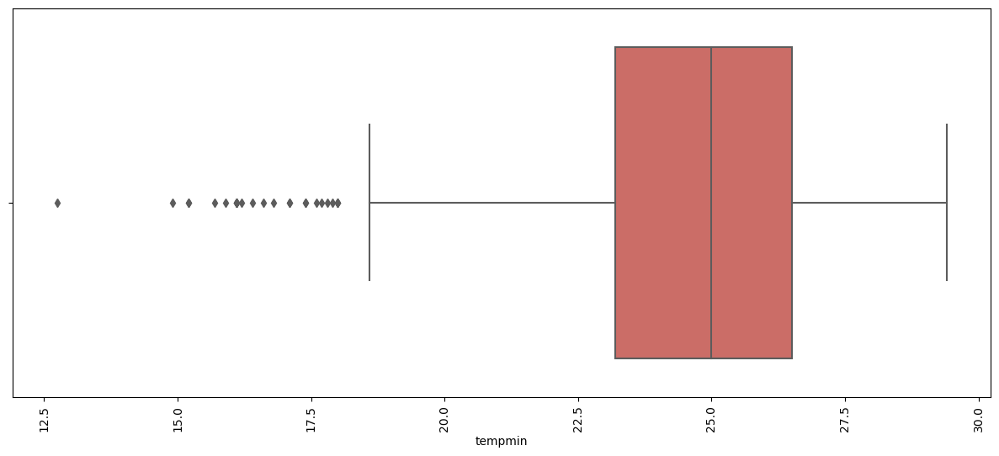

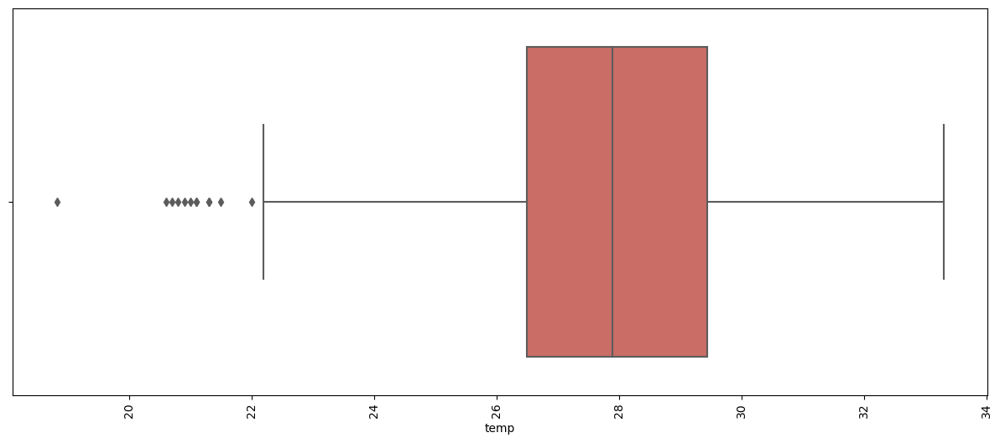

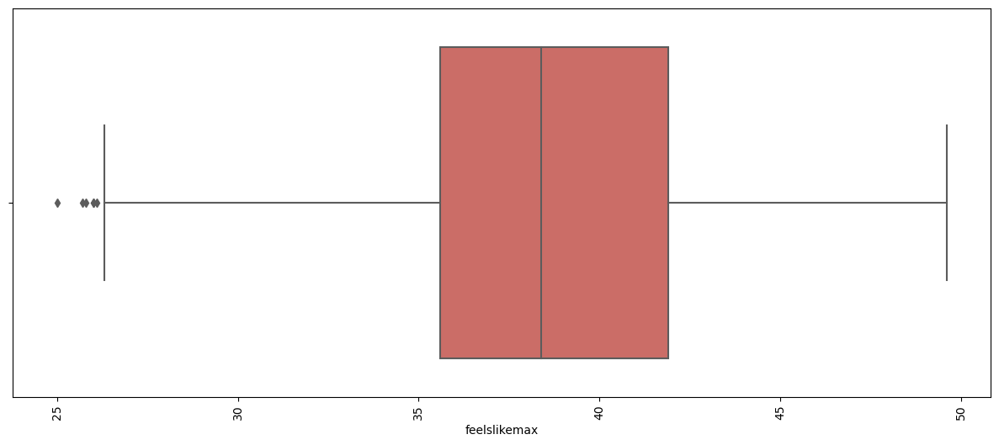

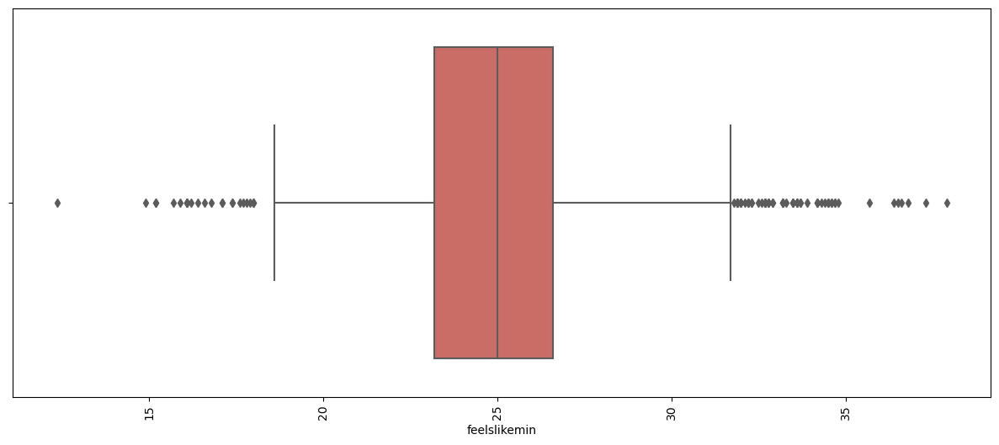

...

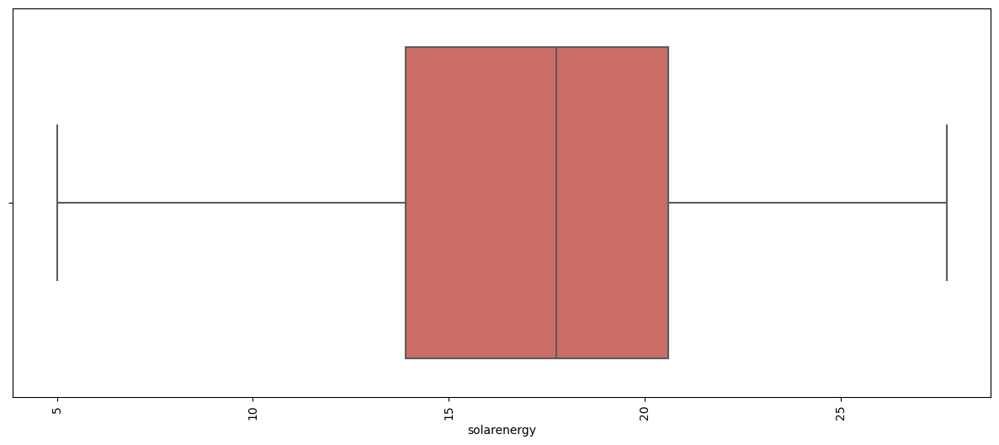

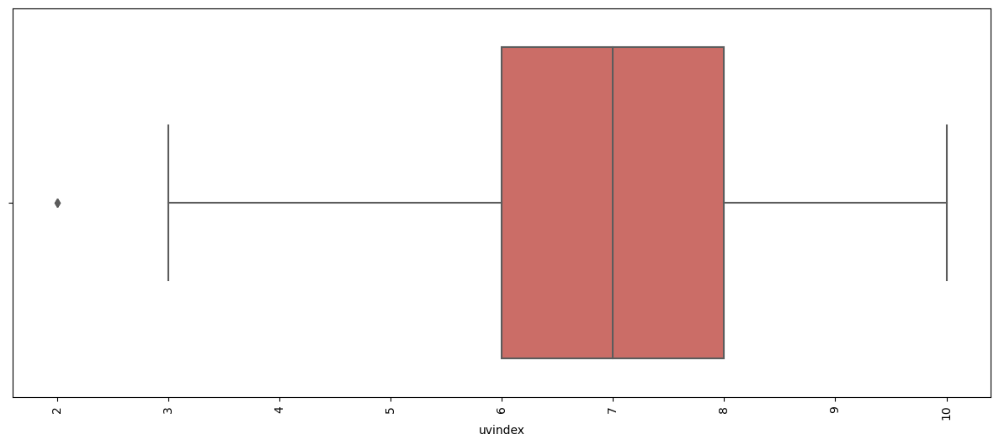

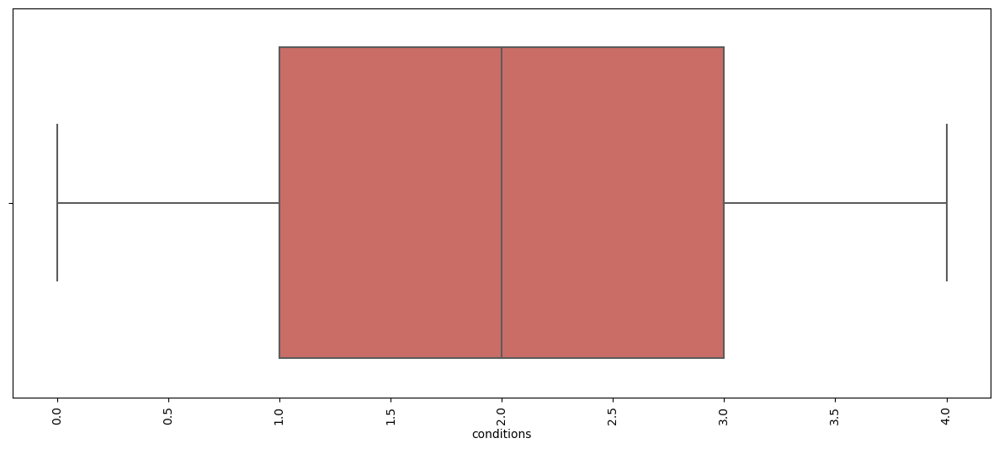

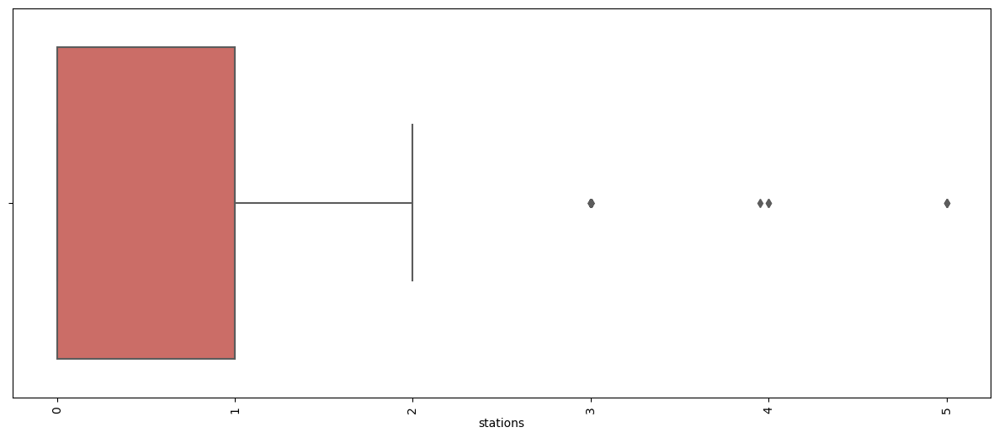

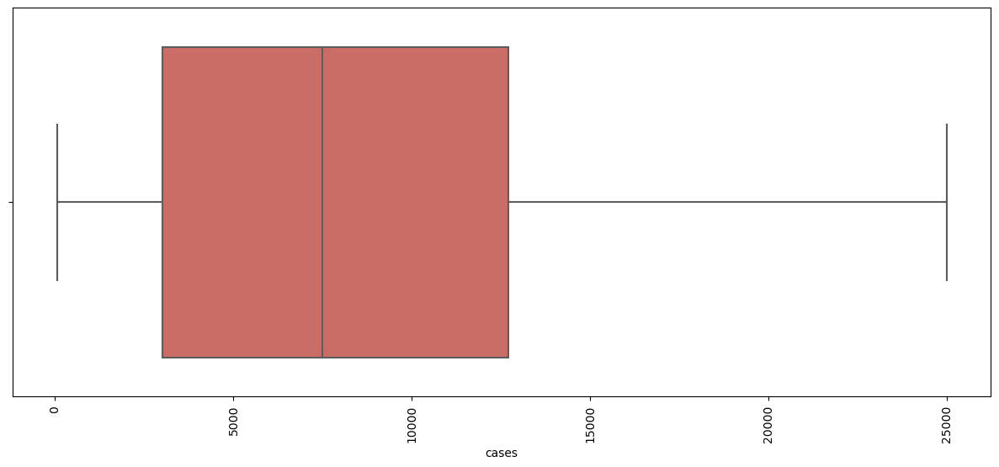

In [22]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette= 'hls')
    plt.xticks(rotation=90)
    plt.show()

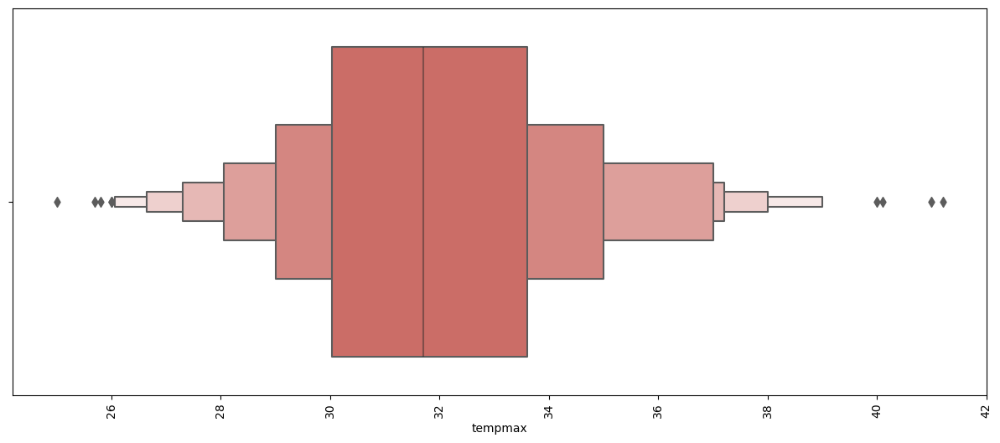

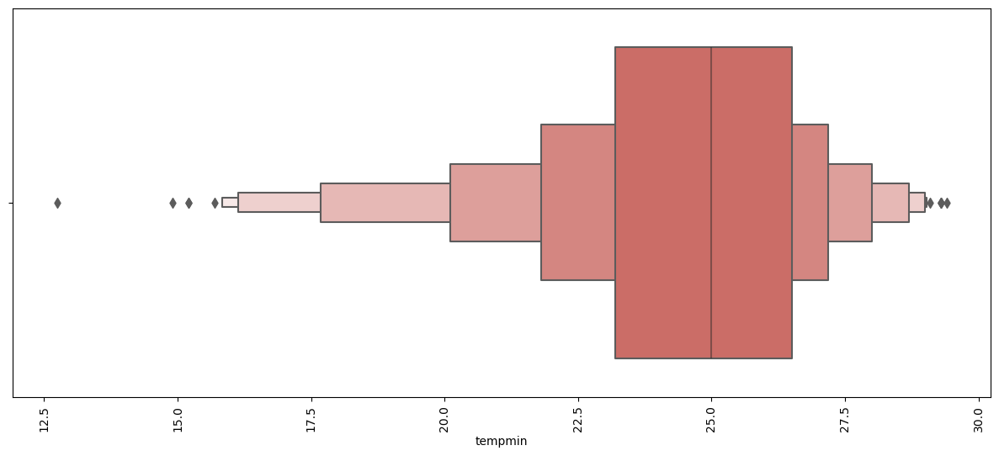

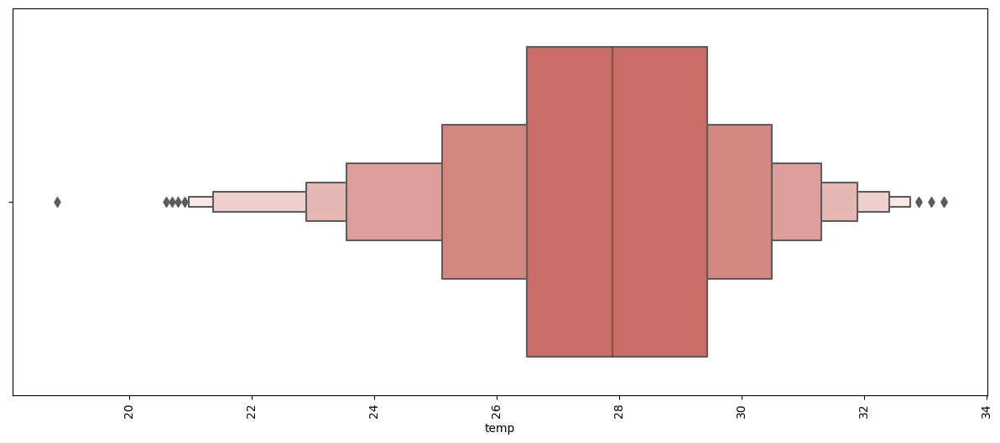

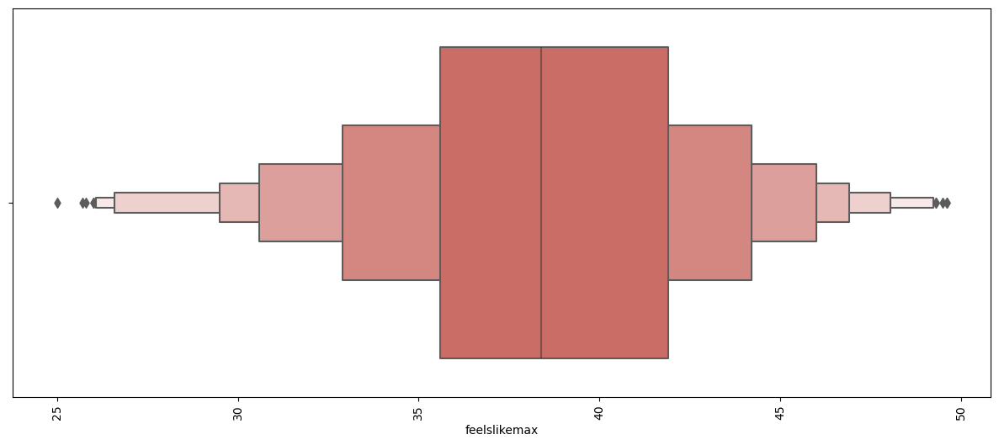

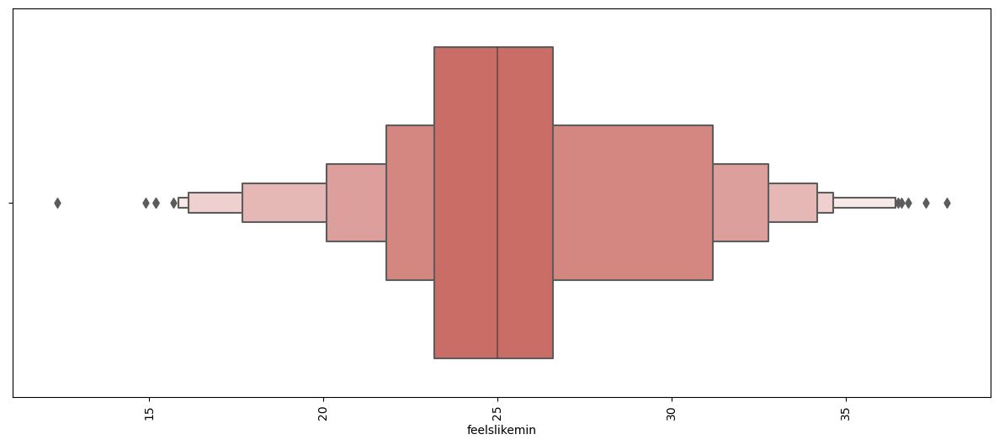

...

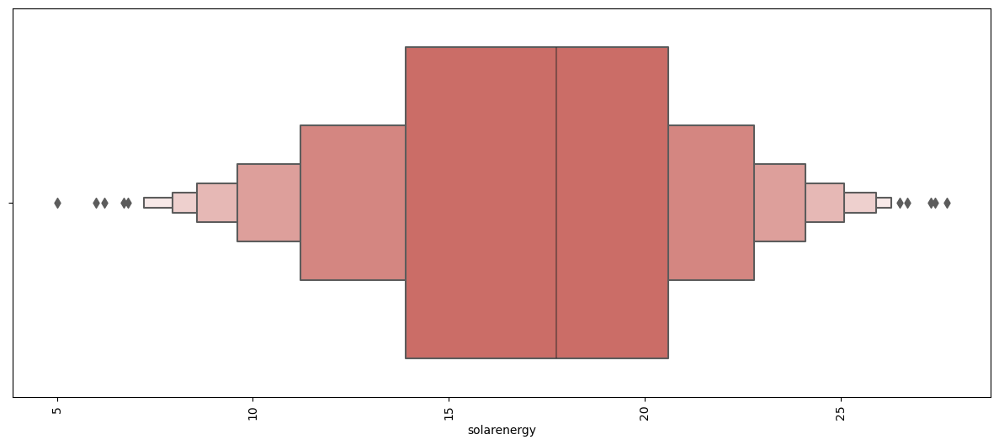

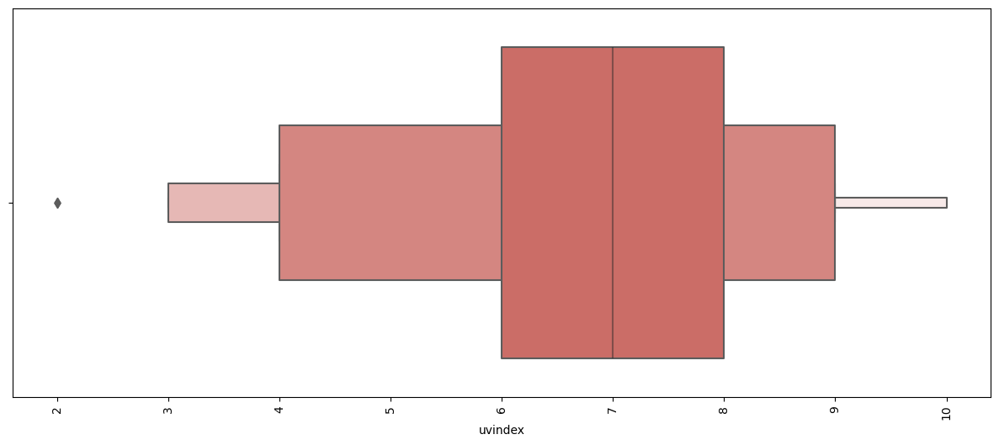

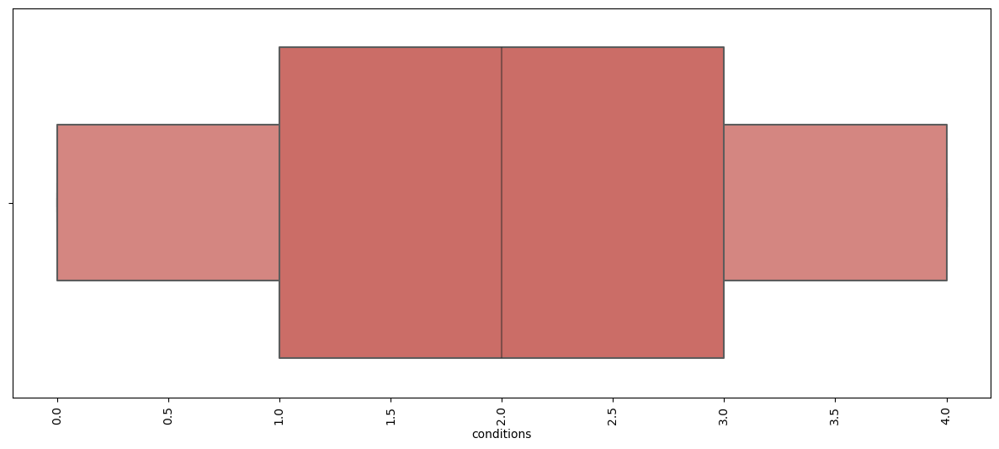

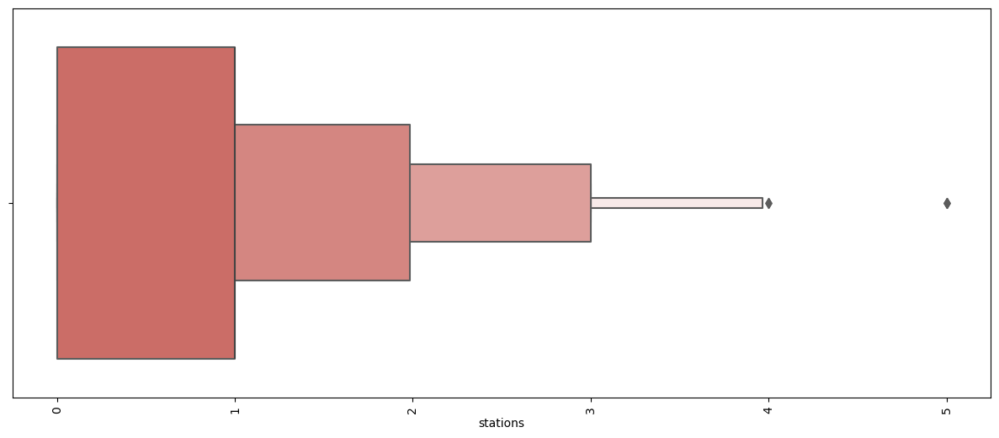

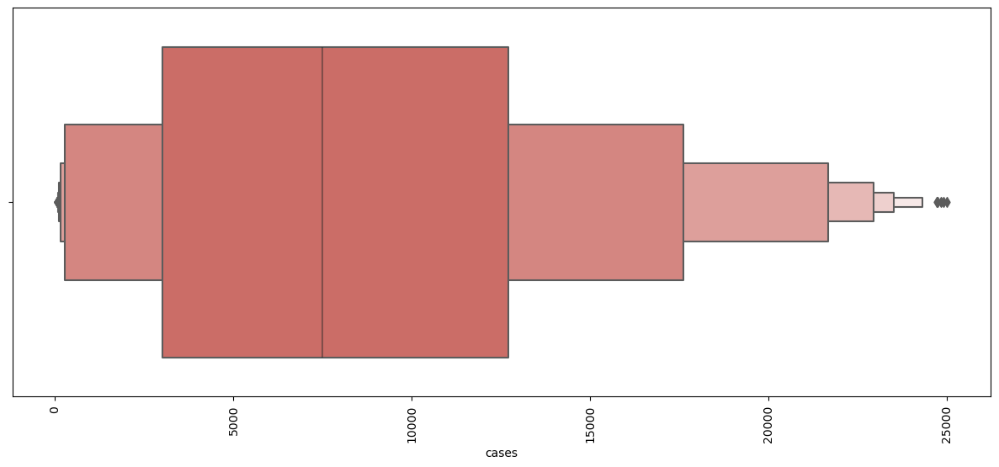

In [23]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxenplot(x=i, data=df,palette='hls')
    plt.xticks(rotation=90)
    plt.show()

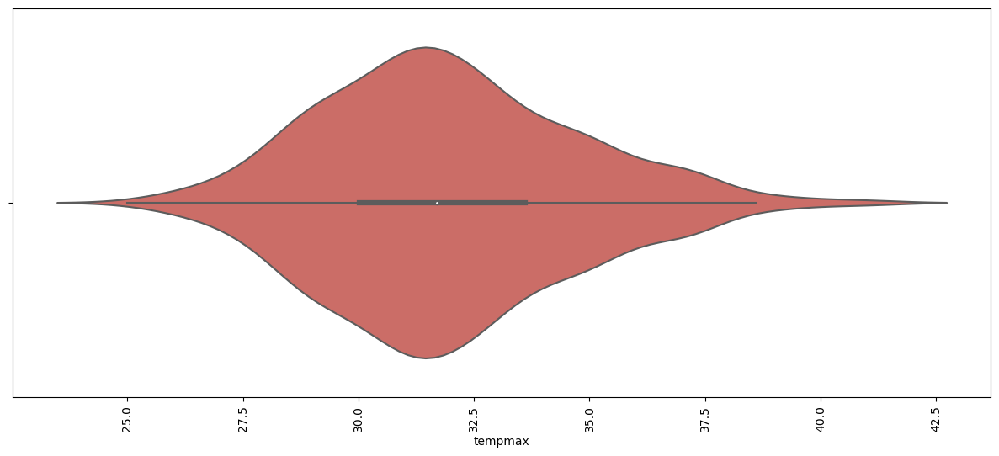

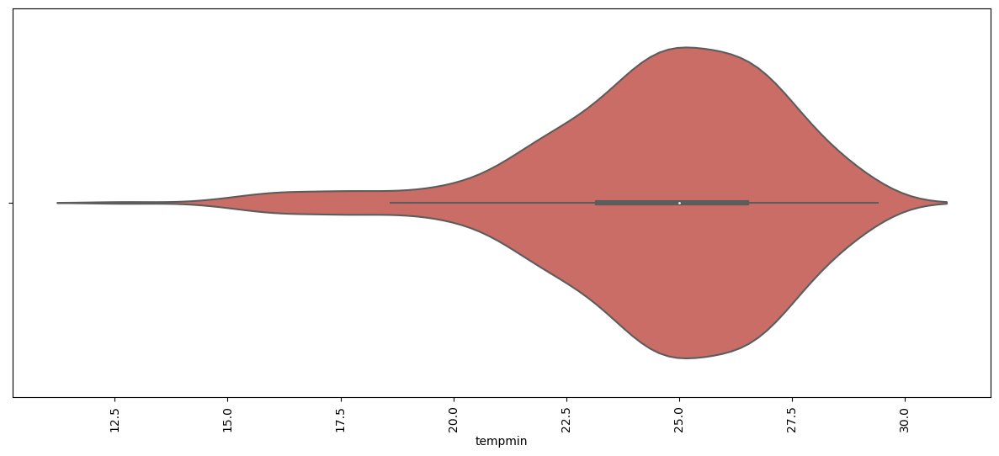

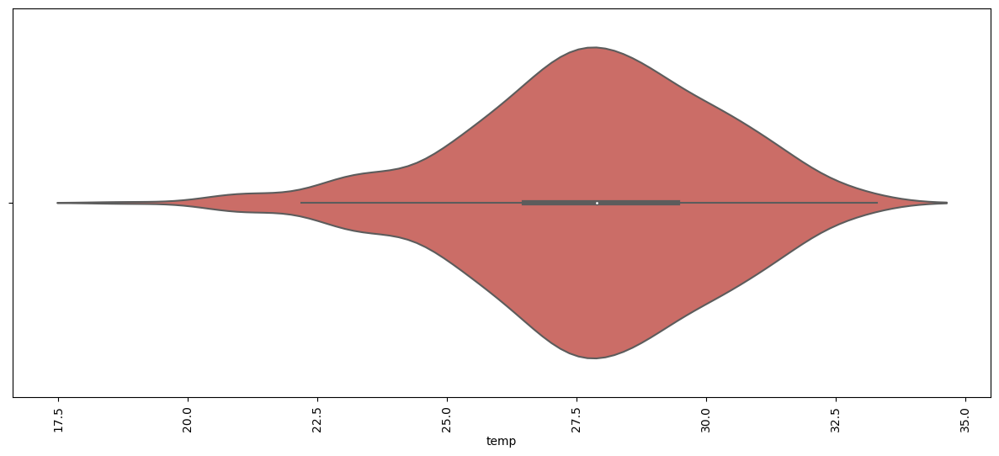

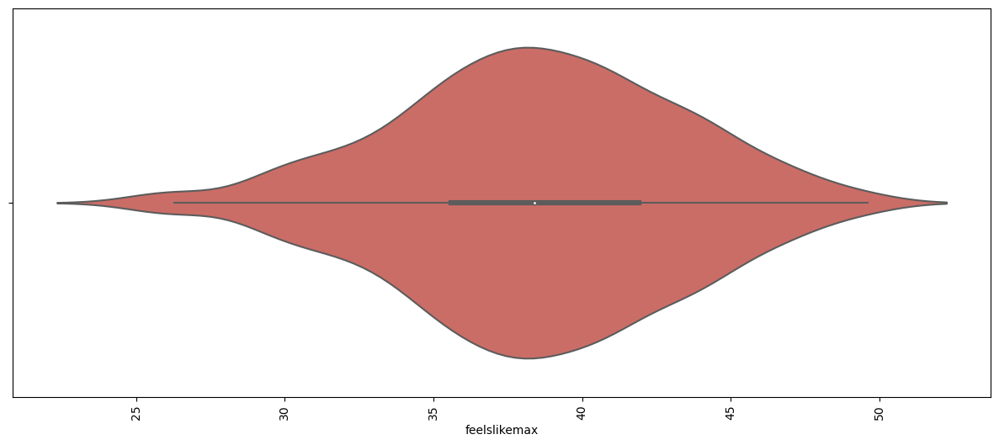

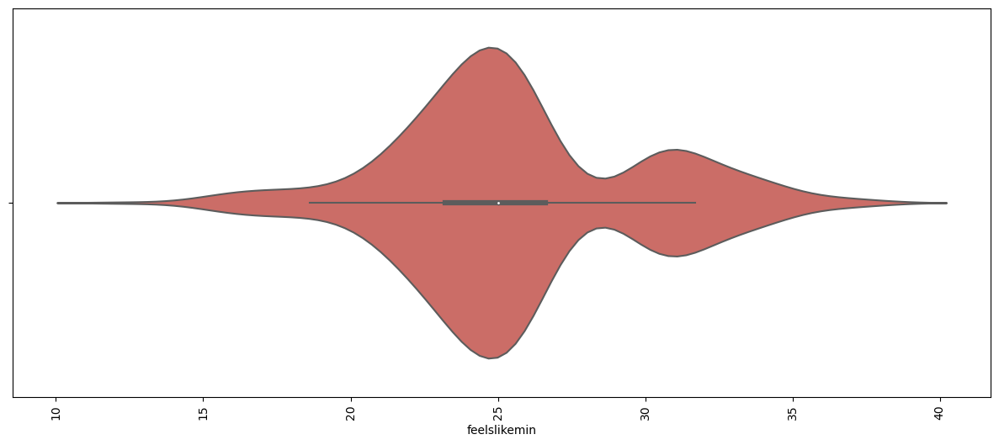

...

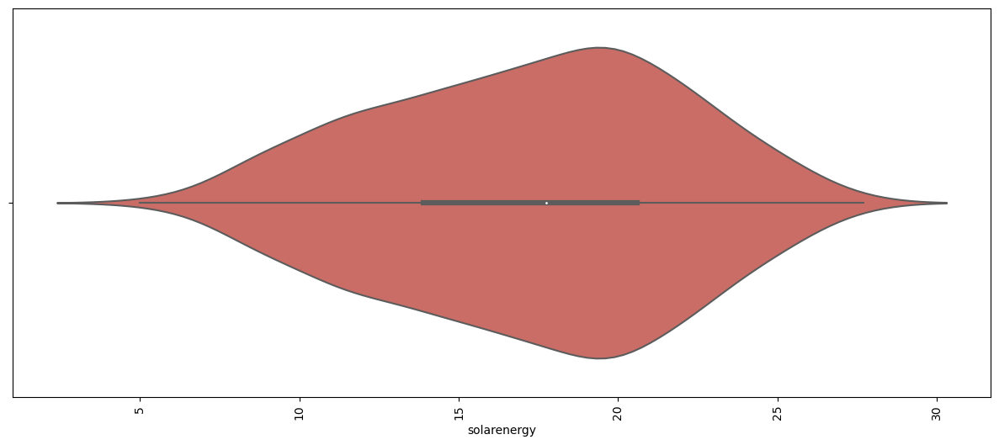

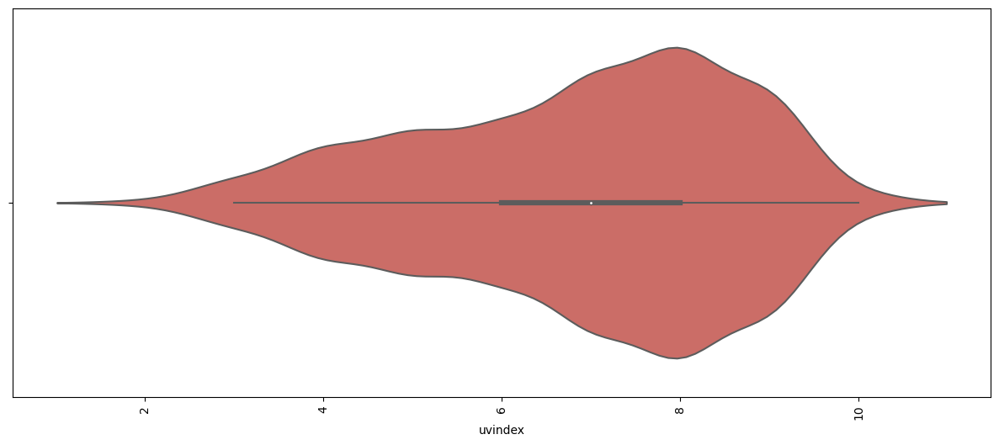

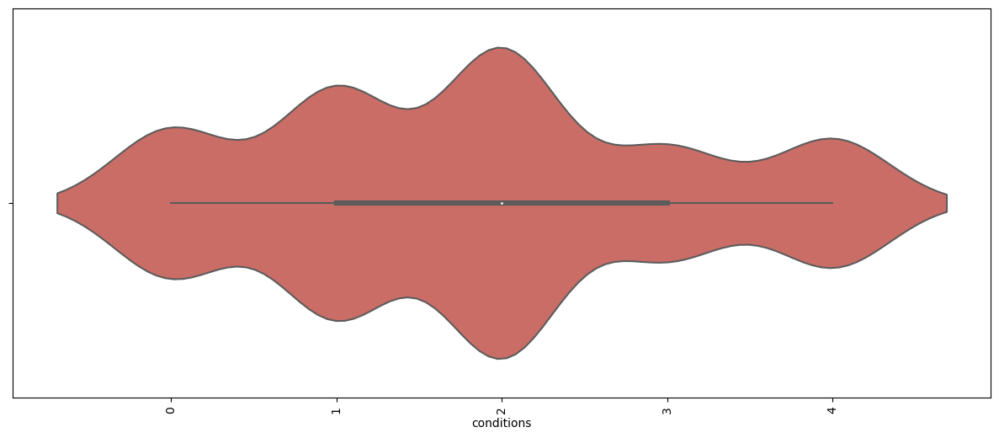

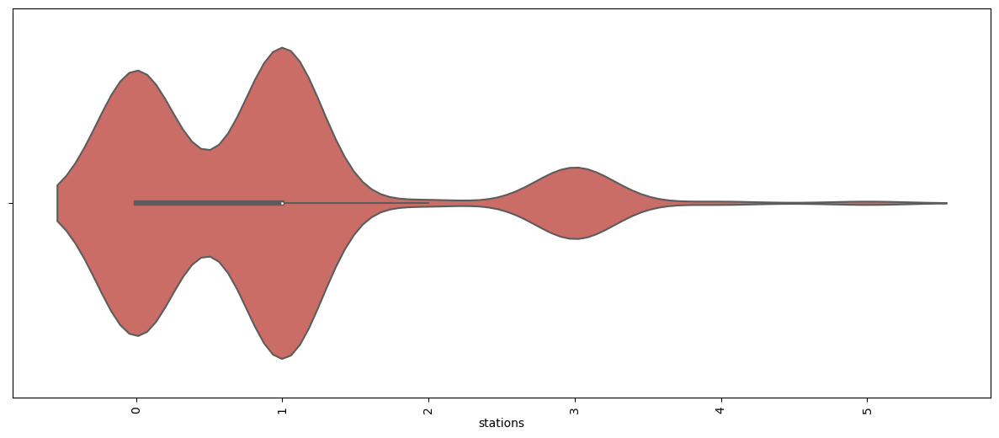

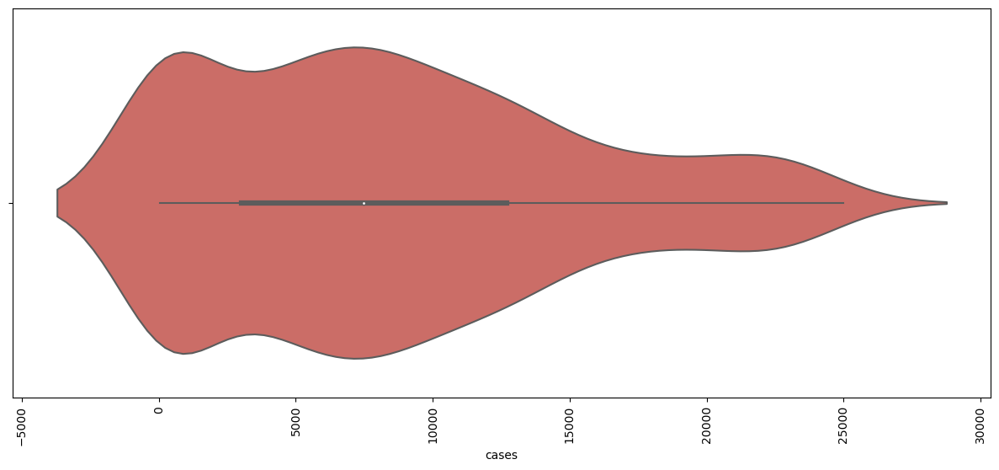

In [25]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.violinplot(x=i, data=df, palette='hls')
    plt.xticks(rotation= 90)
    plt.show()
 

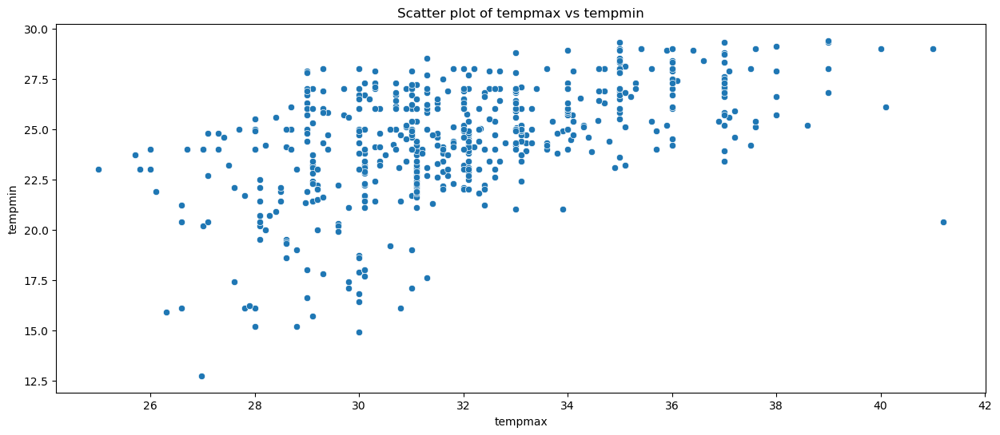

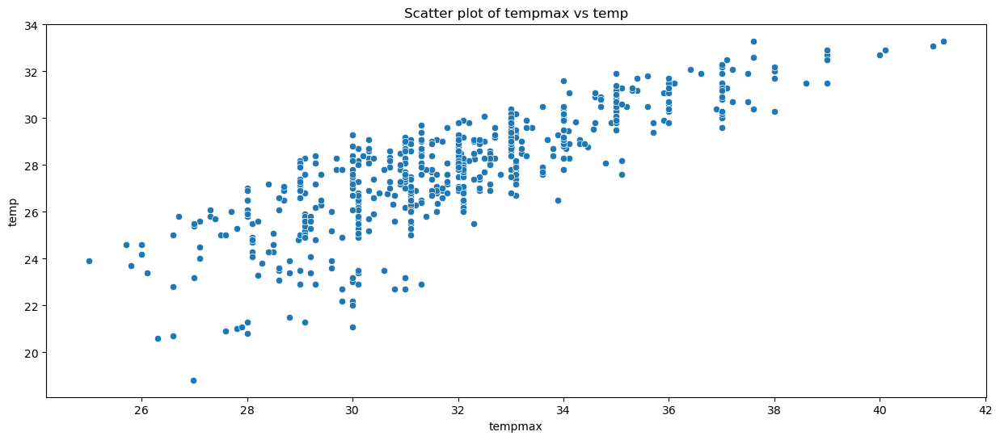

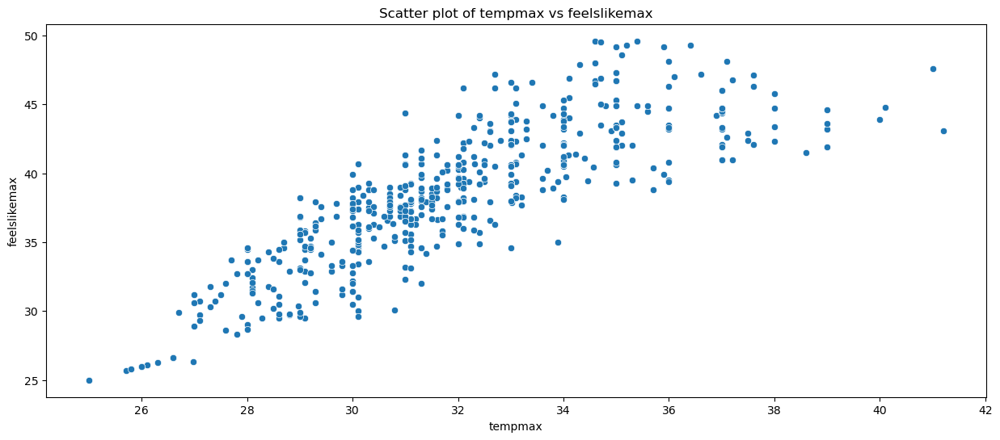

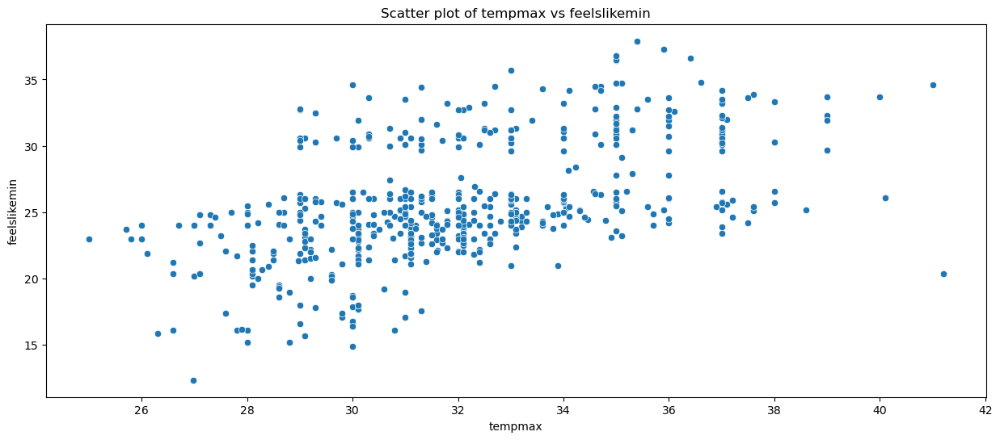

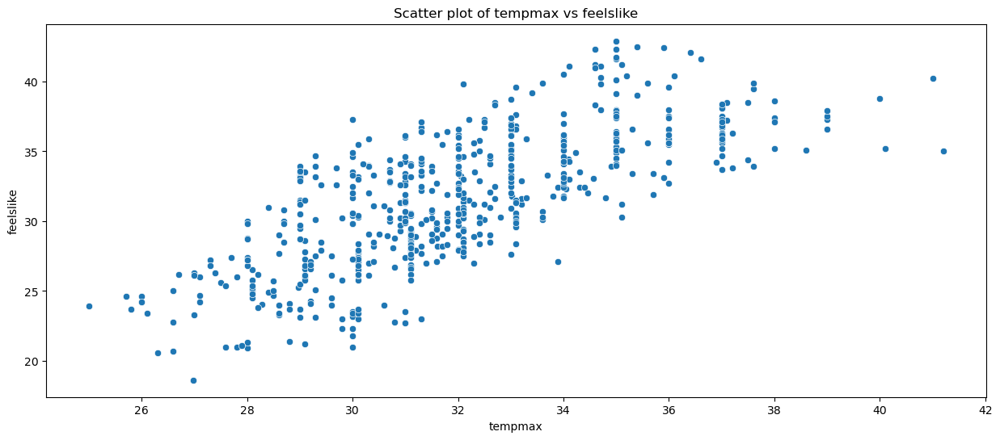

...

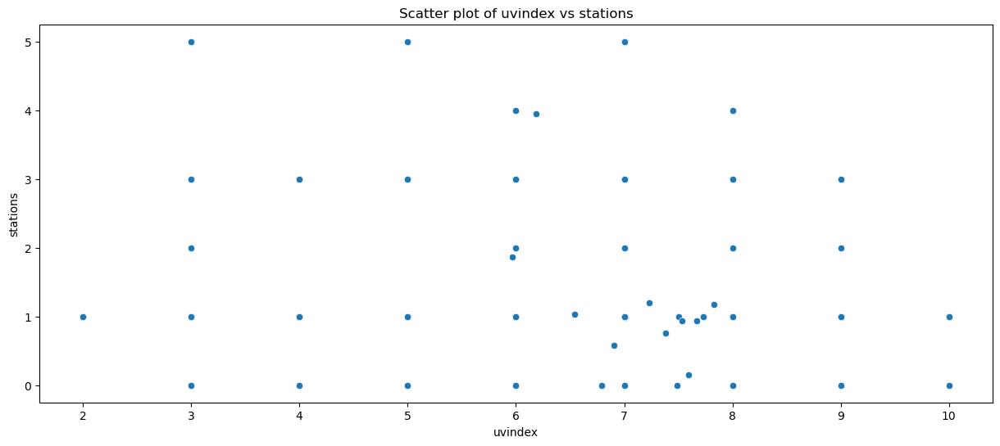

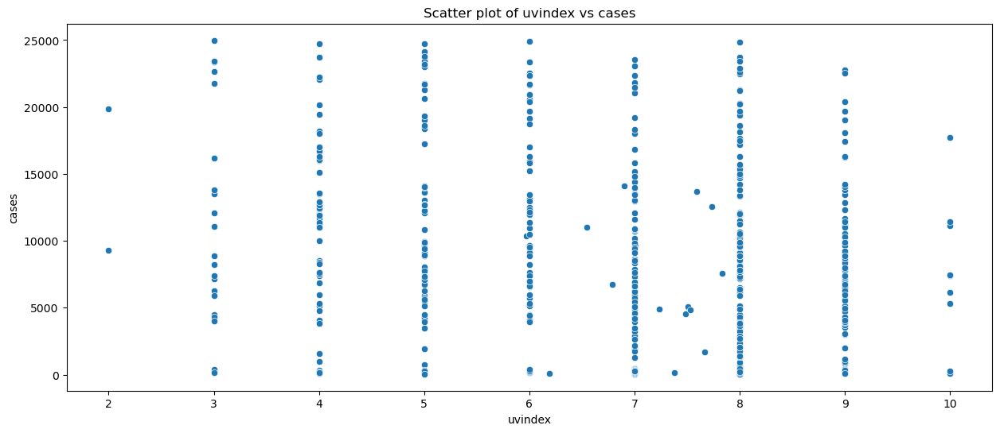

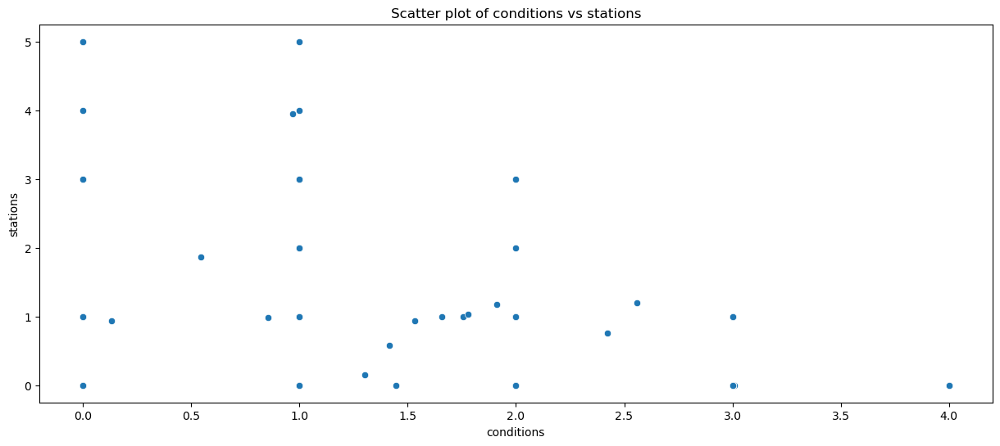

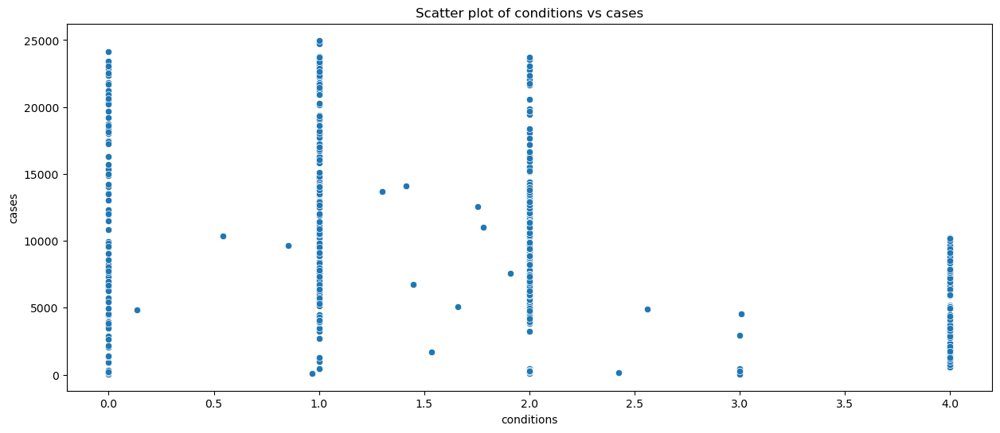

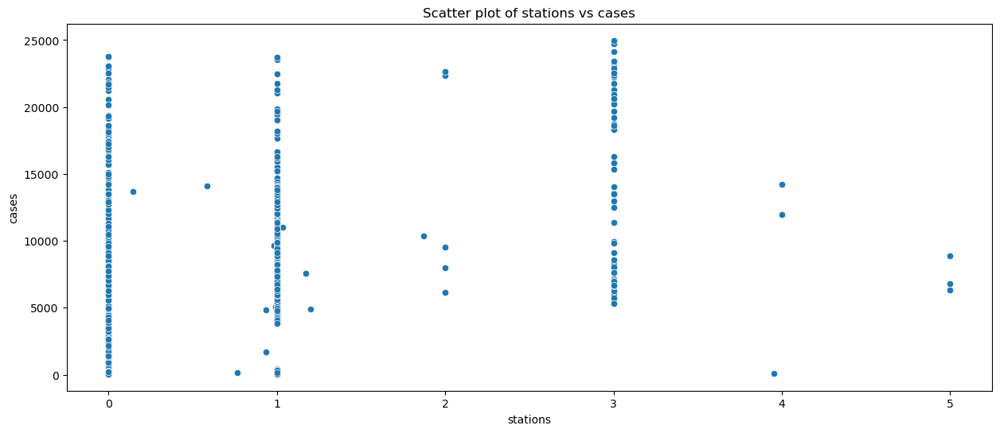

In [27]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()
        

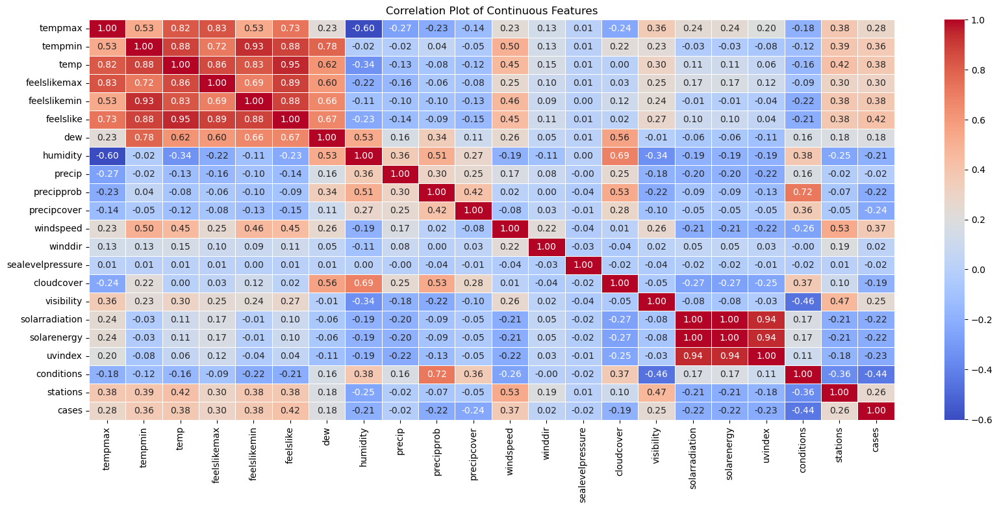

In [28]:
corr_matrix =df[continuous].corr()
plt.figure(figsize=(20, 8))
sns.heatmap(corr_matrix, annot=True, cmap= 'coolwarm' , fmt= ".2f",linewidths= 0.5)
plt.title('Correlation Plot of Continuous Features')
plt.show()

In [30]:
threshold = 0.7
features_to_drop = []

# Assuming corr_matrix is the correlation matrix of your DataFrame
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            if colname not in features_to_drop:
                features_to_drop.append(colname)

# Ensure that you are only dropping columns that exist in the DataFrame
columns_to_drop = [col for col in features_to_drop if col in df.columns]
df = df.drop(columns=columns_to_drop, axis=1)

# Assuming 'labels' is a categorical column you want to one-hot encode
df = pd.get_dummies(df, columns=['labels'])

df.head()  # Display the first few rows of the DataFrame


,tempmax,tempmin,humidity,precip,precipprob,precipcover,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,stations,cases,labels_normal
0,34.053151,24.478082,73.508219,2.921726,44.657534,4.360932,0.0,0.0,15.678356,175.595342,1007.911781,50.747945,3.789863,208.097808,1.197260,4925.0,1
1,34.086179,25.694309,72.066667,3.783415,39.837398,2.676748,0.0,0.0,14.574797,158.349593,1003.533333,48.313821,2.884553,222.926016,0.991870,5077.0,1
2,34.573984,25.417886,69.424390,3.065854,33.333333,2.337805,0.0,0.0,14.978049,202.621138,1005.731707,55.621138,4.242276,229.413008,1.170732,7579.0,1
3,33.020325,25.080488,69.297561,6.025203,37.398374,2.676667,0.0,0.0,16.504878,183.544715,1003.359350,50.208130,2.991057,225.421951,0.146341,13706.0,1
4,30.660976,24.230894,86.652033,23.336585,96.747967,15.616992,0.0,0.0,19.546341,224.030081,1009.995935,45.542276,3.886992,176.598374,3.951220,82.0,1


In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
categorical, non_categorical, discrete, continuous = classify_features(df)
scaler = StandardScaler()
df[continuous] = scaler.fit_transform(df[continuous])
X = df.drop(columns=['cases'])
y = df['cases']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
svm_model = SVR()
svm_model.fit(X_train, y_train)
SVR()
y_pred_svm = svm_model.predict(X_test)
mse_svm = mean_squared_error(y_test, y_pred_svm)
print(f'SVM Mean Squared Error: {mse_svm}')

SVM Mean Squared Error: 0.5295336244289658


In [32]:
from sklearn.tree import DecisionTreeRegressor
dtr_model = DecisionTreeRegressor()
dtr_model.fit(X_train, y_train)
DecisionTreeRegressor()
y_pred_dtr = dtr_model.predict(X_test)
mse_dtr = mean_squared_error(y_test, y_pred_dtr)
print(f'Decision Tree Regressor Mean Squared Error: {mse_dtr}')

Decision Tree Regressor Mean Squared Error: 1.1789134589545085


In [33]:
from sklearn.ensemble import RandomForestRegressor
rfr_model = RandomForestRegressor()
rfr_model.fit(X_train, y_train)

RandomForestRegressor()

In [34]:
y_pred_rfr = rfr_model.predict(X_test)
mse_rfr = mean_squared_error(y_test, y_pred_rfr)
print(f'Random Forest Regressor Mean Squared Error: {mse_rfr}')

Random Forest Regressor Mean Squared Error: 0.5061826708648338


In [40]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [41]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Initialize the model
xgboost_model = XGBRegressor()

# Train the model
xgboost_model.fit(X_train, y_train)

# Make predictions
y_pred_xgb = xgboost_model.predict(X_test)

# Calculate Mean Squared Error
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print(f'XGBoost Regressor Mean Squared Error: {mse_xgb}')

XGBoost Regressor Mean Squared Error: 0.6388940809544029


In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
LinearRegression()
y_pred = linear_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Linear Regression Mean Squared Error: { mse}')
print(f'Linear Regression R^2 Score:{r2}')


Linear Regression Mean Squared Error: 0.6650722290499923
Linear Regression R^2 Score:0.26539125472771496
